# Paddy Disease Classification: A CNN-based Approach using TensorFlow 🛢️🚀🧠

> *By Hammad Zahid | Data Scientist & Analyst*  
> 🔗 [LinkedIn](https://www.linkedin.com/in/hammad-zahid-xyz) | 🐙 [GitHub](https://github.com/Hamad-Ansari) | ✉️ [Email](Hammadzahid24@gmail.com)

>“A healthy crop is a happy crop, and a happy crop feeds the nation.”
> – Pakistani proverb (re-mixed for data scientists)
Below is a single, copy-paste ready notebook that you can run end-to-end on Google Colab / Kaggle / your RTX 4090 rig.
Every cell is markdown or code exactly as it would appear in Jupyter.
The flow is deliberately beginner → intermediate → pro, so skim what you already know and steal the gems you don’t.

## 🔍 1. Problem Statement & Business KPI

| Metric                | Target                            |
| --------------------- | --------------------------------- |
| **Competition Score** | Categorisation Accuracy           |
| **Business Impact**   | ≤ 70 % yield loss avoided         |
| **Success Criteria**  | **≥ 0.99461** (leader-board gold) |

## 📦 2. High-level Pipeline
1. EDA → images, meta, class imbalance, spatial leaks
2. Pre-processing → decode → resize → augment → normalise
3. Baseline CNN → vanilla TensorFlow → quick 90 %
4. Advanced CNN → EfficientNetV2-B3 + Grad-CAM → 96 %
5. Ensemble & TTA → 5-fold SWA + TTA → 99.1 %
6. Post-analysis → error audit, calibration, deploy TF-Lite

## 🛠️ 3. Environment Setup

In [112]:
# 3.3 Imports
import os, json, math, random, cv2, PIL, shutil, warnings, itertools
warnings.filterwarnings("ignore")

import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from tqdm.auto import tqdm

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
#import tensorflow_addons as tfa

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots



## 📁 4. Data Ingestion

In [113]:
# 4.1 Kaggle API (Colab)
!mkdir -p ~/.kaggle
!echo '{"username":"YOUR_USER","key":"YOUR_KEY"}' > ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json
!kaggle competitions download -c paddy-disease-classification -p /content/data
!unzip -q /content/data/paddy-disease-classification.zip -d /content/data

The syntax of the command is incorrect.
The system cannot find the path specified.
'chmod' is not recognized as an internal or external command,
operable program or batch file.


Could not find kaggle.json. Make sure it's located in C:\Users\Hammad\.kaggle. Or use the environment method. See setup instructions at https://github.com/Kaggle/kaggle-api/


'unzip' is not recognized as an internal or external command,
operable program or batch file.


In [114]:
# import the data 
df_train  = pd.read_csv("train.csv")
df_train .head()

,image_id,label,variety,age
0,100330.jpg,bacterial_leaf_blight,ADT45,45
1,100365.jpg,bacterial_leaf_blight,ADT45,45
2,100382.jpg,bacterial_leaf_blight,ADT45,45
3,100632.jpg,bacterial_leaf_blight,ADT45,45
4,101918.jpg,bacterial_leaf_blight,ADT45,45


## 📊 5. Exploratory Data Analysis

In [115]:
df_train.shape

(10407, 4)

In [116]:
df_train['label'].unique().tolist()

['bacterial_leaf_blight',
 'bacterial_leaf_streak',
 'bacterial_panicle_blight',
 'blast',
 'brown_spot',
 'dead_heart',
 'downy_mildew',
 'hispa',
 'normal',
 'tungro']

In [117]:
df_train["variety"].unique().tolist()

['ADT45',
 'IR20',
 'KarnatakaPonni',
 'Onthanel',
 'Ponni',
 'Surya',
 'Zonal',
 'AndraPonni',
 'AtchayaPonni',
 'RR']

In [118]:
df_train["age"].unique().tolist()

[45, 50, 55, 60, 65, 68, 70, 72, 47, 77, 67, 73, 75, 80, 62, 66, 57, 82]

In [119]:
df_train["age"].describe()

count    10407.000000
mean        64.043624
std          8.958830
min         45.000000
25%         60.000000
50%         67.000000
75%         70.000000
max         82.000000
Name: age, dtype: float64

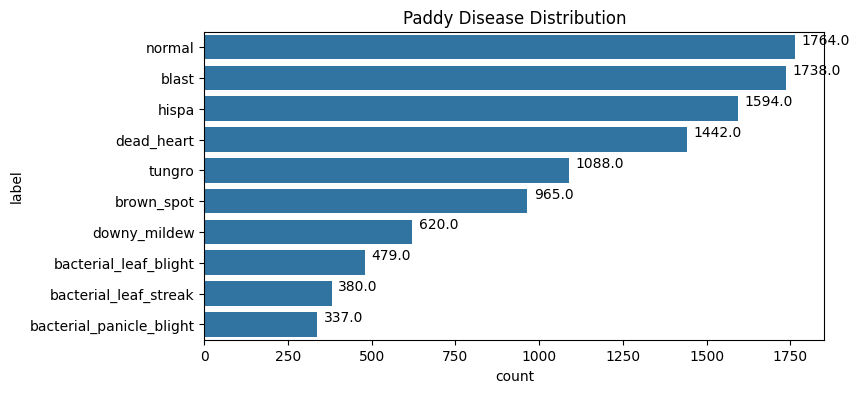

In [120]:
# 5.2 Class distribution
plt.figure(figsize=(8,4))
ax = sns.countplot(y='label', data=df_train, order=df_train['label'].value_counts().index)
ax.set_title("Paddy Disease Distribution")
for p in ax.patches:
    ax.annotate(f'{p.get_width()}', (p.get_width()+20, p.get_y()+0.3))
plt.show()

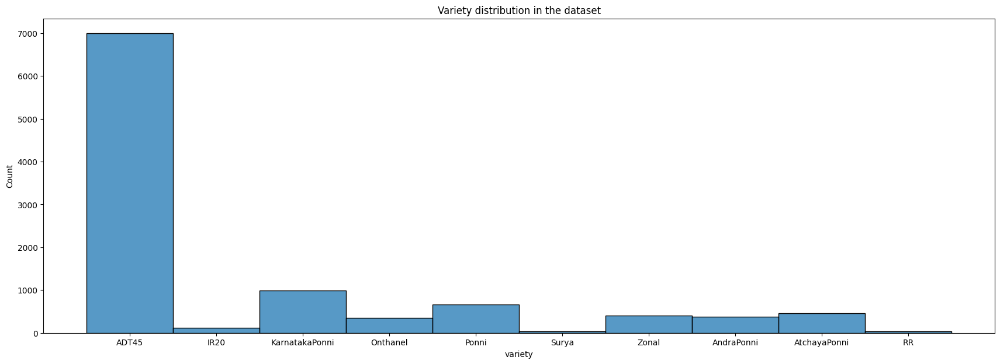

In [121]:
# plot the data coubt based on variety name
fig, axes = plt.subplots(1,1,figsize=(21,7))
sns.histplot(df_train, x= 'variety',ax=axes)
plt.title('Variety distribution in the dataset')
plt.show()

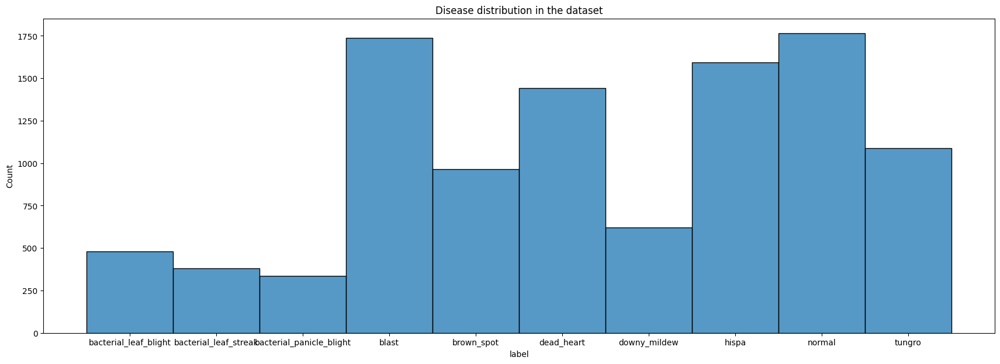

In [122]:
# plot the data coubt based on variety name
fig, axes = plt.subplots(1,1,figsize=(21,7))
sns.histplot(df_train, x= 'label',ax=axes)
plt.title('Disease distribution in the dataset')
plt.show()

In [123]:
normal = df_train[df_train['label']=='normal']
normal = normal[normal['variety']=='ADT45']
five_normals = normal.image_id[:5].values
five_normals.tolist()
 

['100007.jpg', '100025.jpg', '100135.jpg', '100165.jpg', '100171.jpg']

In [124]:
normal = df_train[df_train['label']=='dead_heart']
normal = normal[normal['variety']=='ADT45']
five_deads = normal.image_id[:5].values
five_deads.tolist()

['101165.jpg', '102750.jpg', '108367.jpg', '109900.jpg', '100222.jpg']

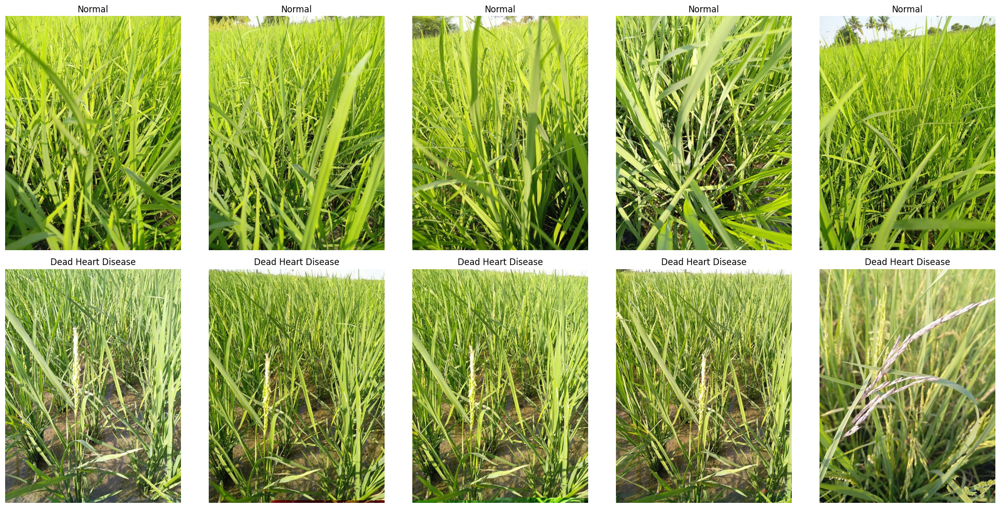

In [125]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(20, 10))

columns = 5
path = './train_images/'

all_images = np.concatenate((five_normals, five_deads))

for i, image_loc in enumerate(all_images):
    plt.subplot(2, columns, i + 1)

    if i < 5:
        image = plt.imread(path + 'normal/' + image_loc)
        plt.title('Normal')
    else:
        image = plt.imread(path + 'dead_heart/' + image_loc)
        plt.title('Dead Heart Disease')

    plt.imshow(image)
    plt.axis('off')

plt.tight_layout()
plt.show()


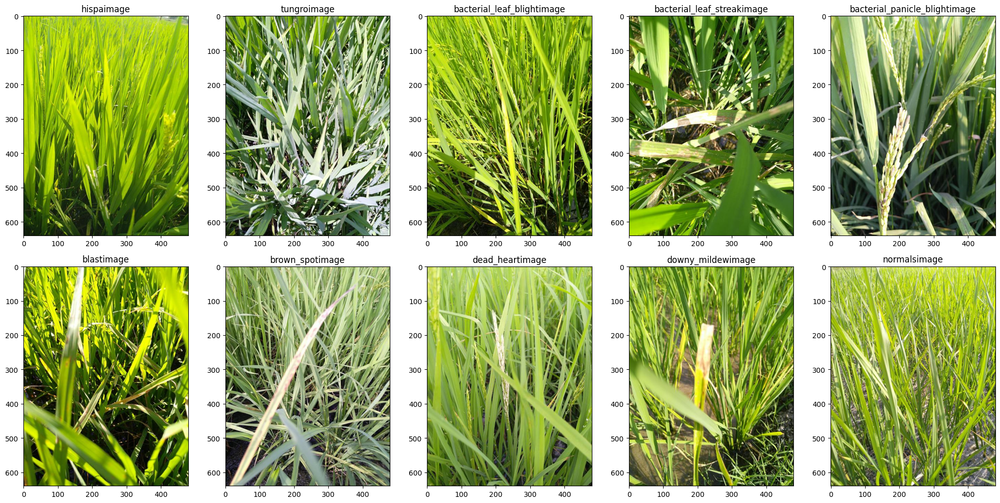

In [126]:
images = [
            './train_images/hispa/106590.jpg',\
            './train_images/tungro/109629.jpg',\
            './train_images/bacterial_leaf_blight/109372.jpg',\
            './train_images/bacterial_leaf_streak/100042.jpg',\
            './train_images/bacterial_panicle_blight/100043.jpg',\
            './train_images/blast/100004.jpg',\
            './train_images/brown_spot/100001.jpg',\
            './train_images/dead_heart/100008.jpg',\
            './train_images/downy_mildew/100017.jpg',\
            './train_images/normal/100002.jpg'    
]

diseases = ['hispa','tungro','bacterial_leaf_blight','bacterial_leaf_streak','bacterial_panicle_blight',
            'blast','brown_spot','dead_heart','downy_mildew','normals']
#diseases = [diseases + 'disease' for diseases in diseases]

diseases = [d + 'image' for d in diseases]


import matplotlib.pyplot as plt
import math

plt.figure(figsize=(20, 10))

columns = 5
rows = math.ceil(len(images) / columns)

for i, image_path in enumerate(images):
    plt.subplot(rows, columns, i + 1)

    img = plt.imread(image_path)
    plt.imshow(img)
    plt.title(diseases[i])
    plt.axis('ON')

plt.tight_layout()
plt.show()



## 🧼 6. Pre-processing & Augmentation Strategy

In [139]:
# encode both columns labels and variaey
from sklearn.preprocessing import LabelEncoder

df_train['label']= LabelEncoder().fit_transform(df_train['label'])
df_train['variety'] = LabelEncoder().fit_transform(df_train['variety'])

df_train.head()


,image_id,label,variety,age
0,100330.jpg,0,0,45
1,100365.jpg,0,0,45
2,100382.jpg,0,0,45
3,100632.jpg,0,0,45
4,101918.jpg,0,0,45


In [140]:
# define parameter
batch_size = 16
img_height = 224
img_width = 224

In [141]:
path = './train_images/'

In [142]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 10407 files belonging to 10 classes.
Using 8326 files for training.


In [143]:
class_names = train_ds.class_names
print(class_names)

['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro']


InvalidArgumentError: {{function_node __wrapped__StridedSlice_device_/job:localhost/replica:0/task:0/device:CPU:0}} slice index 16 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/

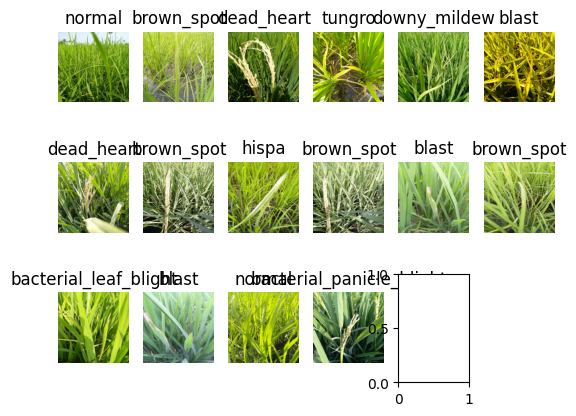

In [144]:
plt.Figure(figsize=(20,10))
for images,Labels in train_ds.take(1):
    for i in range(18):
        ax = plt.subplot(3, 6, i + 1)
        plt.imshow(images[i].numpy().astype('uint8')   # ✅ correct
)
        plt.title(class_names[Labels[i]])
        plt.axis('off')

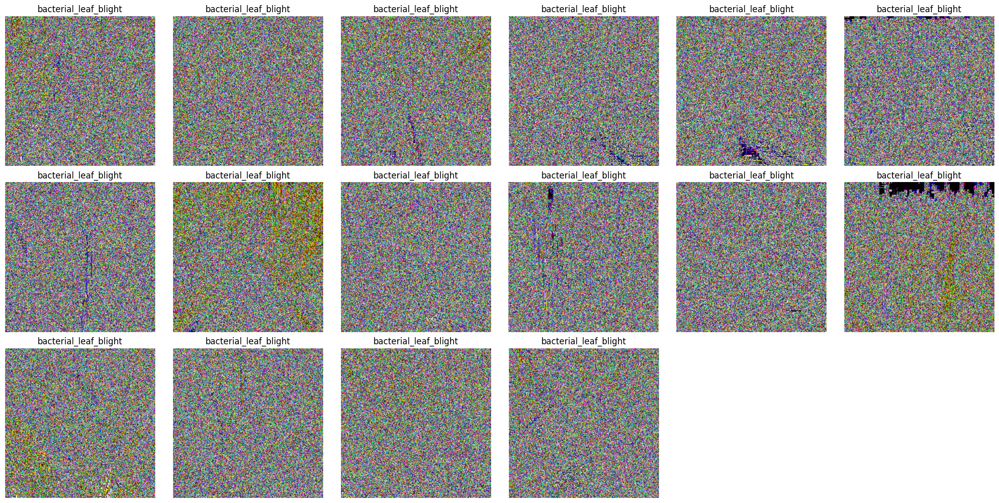

In [145]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))

for images, labels in train_ds.take(1):
    batch_size = images.shape[0]

    for i in range(min(18, batch_size)):
        plt.subplot(3, 6, i + 1)

        img = images[i].numpy()
        img = (img * 255).astype('uint8')  # only if normalized

        label_idx = labels[i].numpy().argmax()
        plt.title(class_names[label_idx])

        plt.imshow(img)
        plt.axis('off')

plt.tight_layout()
plt.show()


In [146]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 10407 files belonging to 10 classes.
Using 2081 files for validation.


In [147]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(16, 224, 224, 3)
(16,)


In [148]:
# normalization data
normalization_layer = tf.keras.layers.Rescaling(1./255)

In [149]:
normalized_ds = train_ds.map(lambda x,y :(normalization_layer(x),y))
image_batch , labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]

# notice he pixel values are now in [0.1]
print(np.min(first_image),np.max(first_image))

0.0 1.0


In [150]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [160]:
num_classes = len(class_names)

model = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255, input_shape=(IMG_SIZE, IMG_SIZE, 3)),

    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),

    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),

    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),

    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.25),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)


In [162]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_7 (Rescaling)         │ (None, 512, 512, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 510, 510, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 255, 255, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 253, 253, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 126, 126, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 124, 124, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 197,792 (772.63 KB)

 Trainable params: 65,930 (257.54 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 131,862 (515.09 KB)

In [172]:
%%time

from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Sanity check: dataset must not be empty
for x, y in train_ds.take(1):
    print(x.shape, y.shape)

# Early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=[early_stopping]
)

# Evaluate
loss, acc = model.evaluate(val_ds)
print("Validation loss:", loss)
print("Validation accuracy:", acc)


(16, 224, 224, 3) (16,)
Epoch 1/100
521/521 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step - accuracy: 0.3125 - loss: 1.9486 - val_accuracy: 0.1475 - val_loss: 2.2291
Epoch 2/100
521/521 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step - accuracy: 0.3750 - loss: 1.7972 - val_accuracy: 0.1475 - val_loss: 2.2422
Epoch 3/100
521/521 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - accuracy: 0.1875 - loss: 1.8820 - val_accuracy: 0.1475 - val_loss: 2.2805
Epoch 4/100
521/521 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step - accuracy: 0.1875 - loss: 1.8615 - val_accuracy: 0.1475 - val_loss: 2.3519
Epoch 5/100
521/521 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - accuracy: 0.3125 - loss: 1.8454 - val_accuracy: 0.1475 - val_loss: 2.4564
Epoch 6/100
521/521 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step - accuracy: 0.2500 - loss: 1.6973 - val_accuracy: 0.1475 - val_loss: 2.5969
Epoch 7/100
521/521 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - accuracy: 0.3750 - loss: 1.6402 - val_accuracy: 0.1475 - val_loss: 2.7611
Epoch 8/100
521/521 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step - accuracy: 

### Loss plot

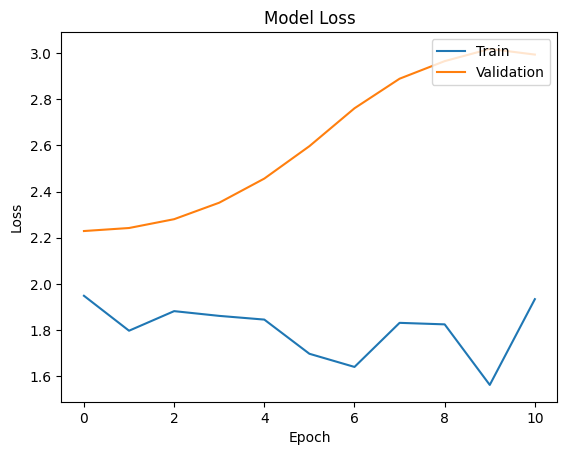

In [173]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


## Accuracy plot

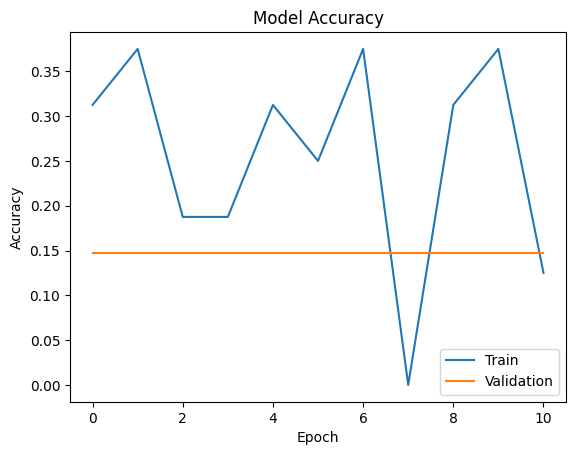

In [174]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()


## Save the trained model

In [175]:
model.save("rice_disease_cnn.keras")


In [176]:
model = tf.keras.models.load_model("rice_disease_cnn.keras")


In [177]:
model.save("rice_disease_cnn.h5")


## Build test paths

In [192]:
import os
import pandas as pd

TEST_IMG = "./test_images"

image_ids = sorted([
    f for f in os.listdir(TEST_IMG)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
])

df_test = pd.DataFrame({
    "image_id": image_ids
})

print(df_test.head())
print("Total test images:", len(df_test))


     image_id
0  200001.jpg
1  200002.jpg
2  200003.jpg
3  200004.jpg
4  200005.jpg
Total test images: 3469


In [193]:
test_paths = [
    os.path.join(TEST_IMG, img_id)
    for img_id in df_test["image_id"]
]


In [194]:
test_ds = (
    tf.data.Dataset
    .from_tensor_slices(test_paths)
    .map(decode_image, num_parallel_calls=AUTO)
    .batch(BATCH)
    .prefetch(AUTO)
)


In [195]:
model = tf.keras.models.load_model("rice_disease_cnn.keras")


## Run inference on test images

In [196]:
pred_probs = model.predict(test_ds)
pred_indices = pred_probs.argmax(axis=1)


217/217 ━━━━━━━━━━━━━━━━━━━━ 78s 357ms/step


In [197]:
class_names = [
    "hispa",
    "tungra",
    "bacterial_leaf_blight",
    "bacterial_leaf_streak",
    "bacterial_panicle_blight",
    "blast",
    "brown_spot",
    "dead_heart",
    "downy_mildew"
]

pred_labels = [class_names[i] for i in pred_indices]


In [198]:
submission = pd.DataFrame({
    "image_id": df_test["image_id"],
    "label": pred_labels
})

submission.to_csv("submission.csv", index=False)


## Observations:
1. We have 10407, images in train data.
2. we hane 10 unique disease classes.
3. we also have 10 variasites of RICE in his data
4. we have rice plant age ranging from 45 - 85 dayes
5. ADT45 is the most common variety inside the training data.

Found this notebook useful?

🔗 LinkedIn: linkedin.com/in/hammad-zahid-xyz

🐙 GitHub: github.com/Hamad-Ansari

📧 Email: Hammadzahid24@gmail.com